In [1]:
dataPath1= 'good/'

In [2]:
MAXLEN=11202

In [3]:
import os
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import gaussian_filter
from torch import nn
import torch.optim as optim
import torch
from torch.utils.data import TensorDataset, DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
from tqdm.notebook import tqdm
from scipy import stats
from IPython.display import clear_output
import pickle 
import scipy

In [4]:
folders = os.listdir(path=dataPath1)

In [5]:
folders

['100', '1000', '200', '300', '400', '500']

In [6]:
good={}

In [7]:
folders = os.listdir(path=dataPath1)
for amp in [100, 200, 300, 400, 500, 1000]:
     good[amp] = [dataPath1+folder+'/'+filename for folder in folders for filename in os.listdir(path=dataPath1+folder) if folder==f'{amp}']

In [8]:
#paired = [filename for filename in os.listdir(path=dataPath)]

In [9]:
# ca1={5:[], 4:[], 3:[], 2:[], 1:[], 0:[]}
# ca3={5:[], 4:[], 3:[], 2:[], 1:[], 0:[]}
# for amp in [5, 4, 3, 2, 1, 0]: #(100, 200, 300, 400, 500, 1000)
#     for i in range(len(paired)):
#         if '.npy' in paired[i] and paired[i][4]==f'{amp}':
#             if 'ca1' in paired[i]:
#                 ca1[amp].append(np.load('data_intersec/'+paired[i]))
                
#             else:
#                 ca3[amp].append(np.load('data_intersec/'+paired[i]))   

In [10]:
def removeArts(signal):
    s = signal.copy()
    mean = np.mean(s)
    normS = normalization(s, True)
    for i in range(5200, 5350):
        if abs(normS[i])>0.7:
            s[i] = s[i-150]
    normS = normalization(s, True)
    for i in range(0, 5200):
        if abs(normS[i])>5:
            s[i] = mean
    for i in range(6000, len(s)):
        if abs(normS[i])>5:
            s[i] = mean
    normS = normalization(s, True)
    for i in range(0, 5200):
        if abs(normS[i])>5:
            s[i] = mean
    for i in range(6000, len(s)):
        if abs(normS[i])>5:
            s[i] = mean
    normS = normalization(s, True)
    for i in range(5200, 5350):
        if abs(normS[i])>0.5:
            s[i] = s[i-150]
    return s
def normalization(s, needStd = False):
    if needStd:
        return np.array((s-s.mean())/s.std())
    else:
        return np.array(s-s.mean())
def normalize(a):
    scaler = preprocessing.MinMaxScaler() 
    return scaler.fit_transform(a)
def gausFilter(signal, sigma = 35):
    min1 = np.min(signal)
    gf = gaussian_filter(signal, sigma)
    min2 = np.min(gf)
    return gf*min1/min2

In [11]:
#загружаем все сигналы в один dict
records={}
for amp in good.keys():
    rec=[]
    for j in good[amp]:
        rec.append(scipy.io.loadmat(j))
    records[amp]=rec


#загружаем в са1
ca1 = {}
for k in records.keys(): 
    rec=[]
    for sig in records[k]:
        for key in sig.keys():
            if str(key).endswith('_2'):
                rec.append(sig[str(key)][:,1])
    ca1[k]=rec



#загружаем в са3
ca3 = {}

for k in records.keys(): 
    rec=[]
    for sig in records[k]:
        for key in sig.keys():
            if str(key).endswith('_3'):
                rec.append(sig[str(key)][:,1])
    ca3[k]=rec

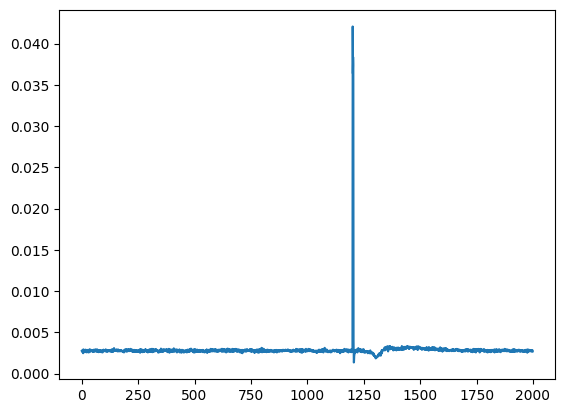

In [12]:
plt.plot(ca3[400][3][4000:6000])

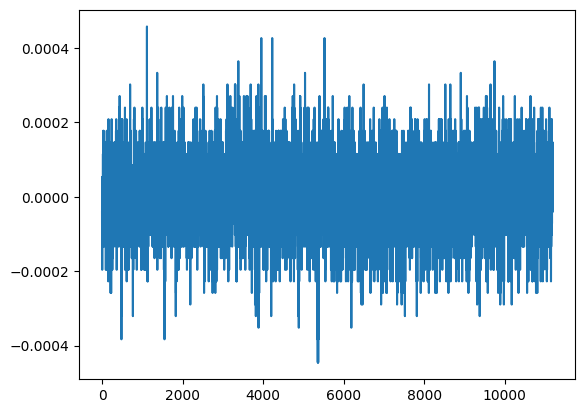

In [13]:
normed1={}
normed3={}
for i, j in zip(ca1.keys(), ca3.keys()):
      
    wa1 = np.array([removeArts(rec) for rec in ca1[i]])
    wa3 = np.array([removeArts(rec) for rec in ca3[j]])
    normca1 = np.array([normalization(rec) for rec in wa1])
    normca3 = np.array([normalization(rec) for rec in wa3])
    if len(wa1)>0:
        meanLine1 = sum(wa1)/len(wa1)
        normMeanLine1 = sum(normca1)/len(normca1)
    if len(wa3)>0:
        meanLine3 = sum(wa3)/len(wa3)
        normMeanLine3 = sum(normca3)/len(normca3)
    if i==400:
        plt.plot(normca3[-1])
    
    normed1[i]=normca1
    normed3[i]=normca3

In [17]:
len(averaged_1[0])

NameError: name 'averaged_1' is not defined

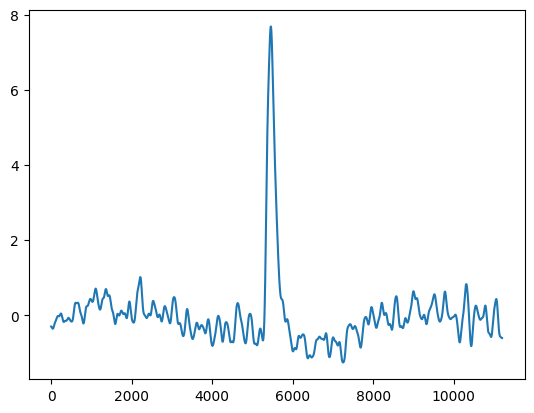

In [14]:
filt1={}
filt3={}
for k in normed1.keys():
    filt1_ = np.array([normalization(gausFilter(rec), True) for rec in normed1[k]])
    filt3_ = np.array([normalization(gausFilter(rec), True) for rec in normed3[k]])
    filt1[k]=filt1_
    filt3[k]=filt3_
plt.plot(filt3[400][3])

In [15]:
averaged1=np.load('CA1_DOWN.npy', allow_pickle=True)
averaged3=np.load('CA3_DOWN.npy', allow_pickle=True)
# for amp in filt1.keys():
#     tmp = np.array(filt1[amp])
#     averaged1.append(sum(tmp)/len(tmp))
# for amp in filt3.keys():
#     tmp = np.array(filt3[amp])
#     averaged3.append(sum(tmp)/len(tmp))

In [18]:
len(averaged1[0])

11202

In [18]:
MAXLEN=11200

In [19]:
def normMetrics(signal, maxlen=MAXLEN):
    left = right = argmin = semiLeft = semiRight = np.argmin(signal)
    minValue = signal[argmin]
    semiMin = minValue/2
    mean = np.mean(signal)
    found = False
    while signal[left]<mean and left>0:
        left-=1
        if (signal[left]>semiMin) and not found:
            semiLeft = left
            found = True
    found = False
    while signal[right]<mean and right<maxlen:
        right+=1
        if (signal[right]>semiMin) and not found:
            semiRight = right
            found = True
    SL = (argmin-left) / minValue
    HW = semiRight-semiLeft
    TD = argmin - left
    TR = right - argmin
    MV = minValue
    return [SL, HW, TD, TR]

In [20]:
SL=[]
HW=[]
TD=[]
TR=[]
for amp in range(6):
    allMetrics = normMetrics(averaged1[amp])
    SL.append(allMetrics[0])
    HW.append(allMetrics[1])
    TD.append(allMetrics[2])
    TR.append(allMetrics[3])
# for amp in filt3.keys():
#     allMetrics = np.array([normMetrics(s) for s in filt3[amp]])
#     for m in allMetrics:
#         SL.append(m[0])
#         HW.append(m[1])
#         TD.append(m[2])
#         TR.append(m[3])
minSL=min(SL)
maxSL=max(SL)
minHW=min(HW)
maxHW=max(HW)
minTD=min(TD)
maxTD=max(TD)
minTR=min(TR)
maxTR=max(TR)

In [21]:
#режет на пересекающиеся куски, [0] - ca1, [1] - ca3
def create_inout_sequences(input_data, target_data, tw, hop, batch_size=64):
    inout_seq = []
    L = len(input_data)
    for i in range(0, L - max(batch_size,tw), hop):
        train_seq = input_data[i:i+tw]
        train_label = target_data[i:i+tw]
        inout_seq.append((torch.FloatTensor(train_seq), torch.FloatTensor(train_label)))
    return inout_seq

In [22]:
class LSTMModel(nn.Module):
    def __init__(self, input_size=1, hidden_layer_size=100, num_layers=2, output_size=1, dropout=0.2):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size

        self.linear_1 = nn.Linear(input_size, hidden_layer_size)
        self.relu = nn.ReLU()
        self.lstm = nn.LSTM(hidden_layer_size, hidden_size=self.hidden_layer_size, 
                            num_layers=num_layers, batch_first=True, bidirectional=True)
        self.dropout = nn.Dropout(dropout)
        self.linear_2 = nn.Linear(2*hidden_layer_size, output_size)


    def forward(self, x):
        batchsize = x.shape[0]

        # layer 1
        x = self.linear_1(x)
        x = self.relu(x)

        # LSTM layer
        lstm_out, _ = self.lstm(x)

        # layer 2
        x = self.dropout(lstm_out)
        predictions = self.linear_2(x)
        return predictions

In [23]:
def GetWeitsWin(concat_len):
    y_data = stats.norm.pdf(np.arange(0, concat_len, 1), 0, concat_len/5)
    y_data2 = stats.norm.pdf(np.arange(-concat_len, 0, 1), 0, concat_len/5)

    weights = np.concatenate((np.expand_dims(y_data, axis=1), np.expand_dims(y_data2, axis=1)), axis=1)
    weights = weights / np.expand_dims(weights.sum(axis=1), axis=1)
    return weights

In [24]:
def SmoothSignal(signal, win, hop):
    #now support only win // hop = 2
    sm_signal = []
    weights = GetWeitsWin(hop)
    sm_signal.append(signal[:hop])
    for w in range(0, len(signal) - win, win):
        left_signal = signal[w+(win-hop):w+win] * weights[:, 0]
        right_signal = signal[w+win:w+win+hop] * weights[:, 1]
           
        sm_signal.append(left_signal + right_signal)
    #sm_signal.append(signal[w+win+hop: w+2*win])
        
    return np.array(sm_signal).flatten()

In [25]:
def GetPredSignal(model_lstm, win, hop, test_dataloader):
    preds = []
    model_lstm.eval()
    for idx, (x, y) in enumerate((test_dataloader)):


            x = x[..., None].to('cuda')

            out = model_lstm(x)
            
            
            preds.append(out.detach().cpu().numpy().flatten())
    preds = np.array(preds).flatten()
    sm_preds = SmoothSignal(preds, win, hop)
    return sm_preds

In [26]:
def getMetrics(signal, maxlen=MAXLEN):
    left = right = argmin = semiLeft = semiRight = np.argmin(signal)
    minValue = signal[argmin]
    semiMin = minValue/2
    mean = np.mean(signal)
    found = False
    while signal[left]<mean and left>0:
        left-=1
        if (signal[left]>semiMin) and not found:
            semiLeft = left
            found = True
    found = False
    while signal[right]<mean and right<maxlen:
        right+=1
        if (signal[right]>semiMin) and not found:
            semiRight = right
            found = True
    SL = (argmin-semiLeft) / abs(minValue)
    SL = (SL-minSL)/(maxSL-minSL)
    HW = semiRight-semiLeft
    HW = (HW-minHW)/(maxHW-minHW)
    TD = argmin - left
    TD = (TD-minTD)/(maxTD-minTD)
    TR = right - argmin
    TR = (TR-minTR)/(maxTR-minTR)
    #MV = (minValue - minMV)/(maxMV-minMV)
    #coefs = [0.05, 0.3, 0.05, 0.3, 0.3]
    #coefs=[0.5, 0.5]
    # = [0.1, 0.4, 0.1, 0.4]
    #metric = coefs[0]*SL+coefs[1]*HW+coefs[2]*TD+coefs[3]*TR+coefs[4]*MV
    #metric = coefs[0]*HW
    return [SL, HW, TD, TR]

In [27]:
getMetrics(averaged1[2])

[6.116002279626736, 0.2, 0.5555555555555556, 0.6982758620689655]

In [28]:
getMetrics(averaged1[3])

[6.168678051825912, 1.0, 0.8888888888888888, 0.9870689655172413]

In [29]:
def run_epoch(test_data, optimizer, criterion, model, dataloader, is_training, ca1=None, mode="interval", win=None, hop=None):
    epoch_loss = 0
    sm_preds=0
    if is_training:
        model.train()
    else:
        model.eval()

    preds = []
    for idx, (x, y) in enumerate(dataloader):
        if is_training:
            optimizer.zero_grad()
              
        x = x[..., None].to('cuda')
        y = y[..., None].to('cuda')

        out = model(x)       
        #print(out.shape)
        loss = criterion(out.contiguous(), y.contiguous())
        
        if is_training:
            loss.backward()
            optimizer.step()
        
        if not is_training:
            preds.append(out.detach().cpu().numpy().flatten())
        epoch_loss += (loss.detach().item() / len(dataloader))

    
    metric = None
    sm_preds=[]
    metrics=[]
    if not is_training:
        for i in range(len(test_data)):
            sm_preds.append(SmoothSignal(preds[i], win, hop))
            [SL1, HW1, TD1, TR1] = getMetrics(preds[i])
            [SL2, HW2, TD2, TR2] = getMetrics(test_data[i])
            metrics.append(0.2*(SL1-SL2)**2 + 0.4*(HW1-HW2)**2 + 0.1*(TD1-TD2)**2 + 0.3*(TR1-TR2)**2)

    return epoch_loss, np.mean(metrics), sm_preds

In [42]:
def RunExperement(iter1, iter2, train_ca3, train_ca1, test_ca3, test_ca1, batch_size, train_window, hop_len, n_hidden, dropout, num_layers, mode, exp_name, epochs=50):
    print(exp_name)
    train_inout_seq=[]
    test_inout_seq=[]
    for i in range(len(train_ca1)):
        train_inout_seq += create_inout_sequences(train_ca3[i], train_ca1[i], train_window, hop_len, batch_size)
    for i in range(len(test_ca1)):
        test_inout_seq += create_inout_sequences(test_ca3[i], test_ca1[i], train_window, hop_len, batch_size)
    
    train_dataloader = DataLoader(train_inout_seq, batch_size=batch_size, shuffle=True, drop_last=True)
    test_dataloader = DataLoader(test_inout_seq, batch_size=batch_size, shuffle=False, drop_last=True)

    model_lstm = LSTMModel(input_size=1, hidden_layer_size=n_hidden, num_layers=num_layers, output_size=1, dropout=dropout)
    model_lstm = model_lstm.to('cuda')
    
    # define optimizer and loss function
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model_lstm.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-9)
    scheduler = ReduceLROnPlateau(optimizer, 'min', factor=0.5, patience=5, min_lr=0.00001)

    losses_train = []
    losses_test = []
    best_loss = best_metric = 10e9

    best_pred=[]
    metrics = []
    # begin training
    for epoch in tqdm(range(epochs)):
    #for epoch in range(epochs): 
        loss_train, _, _ = run_epoch(train_ca1, optimizer, criterion, model_lstm, train_dataloader, is_training=True)


        loss_val, metric, pred = run_epoch(test_ca1, optimizer, criterion, model_lstm, test_dataloader, is_training=False, ca1=test_ca1, 
                                     mode=mode, win=train_window, hop=hop_len)
        scheduler.step(loss_val)
        losses_train.append(loss_train)
        losses_test.append(loss_val)
        metrics.append(metric)

        if metrics[-1] < best_metric:
            best_metric = metrics[-1]
            #torch.save(model_lstm.state_dict(), "BestMetric"+exp_name)
            best_pred=pred
            torch.save(model_lstm.state_dict(), f'Best_i_{iter1}_j_{iter2}_exp_{exp_name}')
    
    # для подбора гиперпараметров: если нужно выводить графики для каждого эксперимента
    plt.figure(figsize=(7, 4))
    plt.plot(test_ca1[0])
    plt.plot(best_pred[0])    
    plt.show()
    #torch.save(model_lstm, 'Best')
    return best_loss, best_metric, best_pred, model_lstm

# Подбор гиперапараметров

In [36]:
i=0
test_ca1= []
test_ca3= []
test_ca1.append(averaged1[i])
test_ca3.append(averaged3[i])

temp1 = averaged1
temp3 = averaged3
train_1 =np.delete(temp1, i, 0)
train_3 = np.delete(temp3, i, 0)

In [38]:
len(train_ca1)

4

win1000batch16n_hidden200dropout2num_layers2interval


  0%|          | 0/100 [00:00<?, ?it/s]

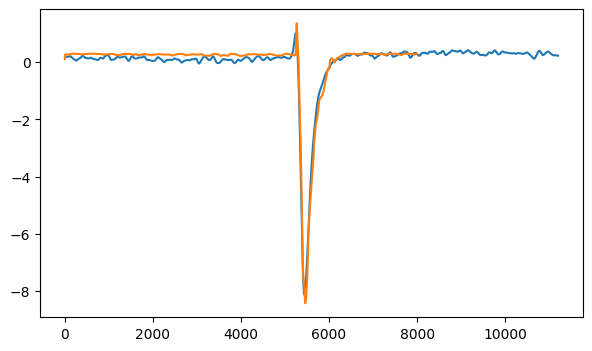

win1000batch16n_hidden200dropout2num_layers2interval


  0%|          | 0/100 [00:00<?, ?it/s]

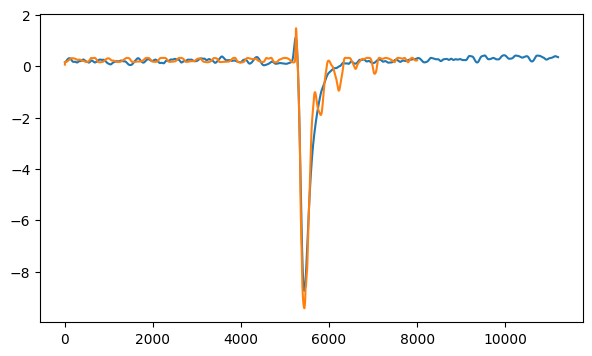

win1000batch16n_hidden200dropout2num_layers2interval


  0%|          | 0/100 [00:00<?, ?it/s]

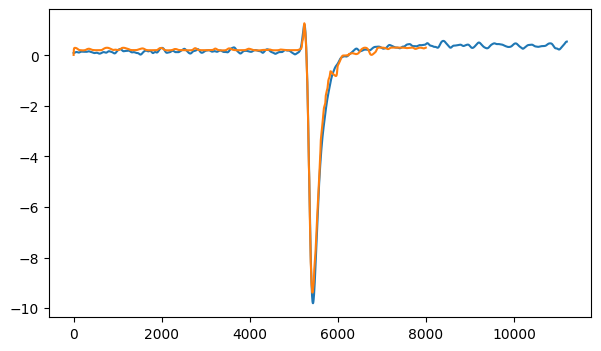

win1000batch16n_hidden200dropout2num_layers2interval


  0%|          | 0/100 [00:00<?, ?it/s]

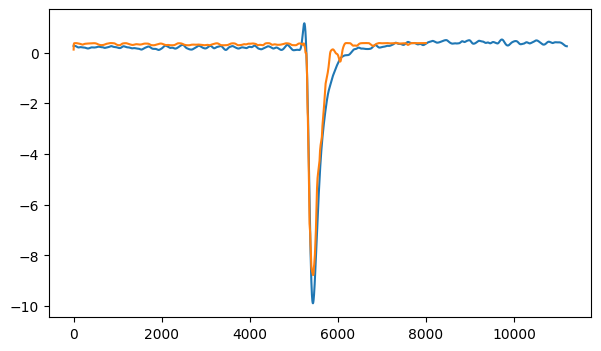

win1000batch16n_hidden200dropout2num_layers2interval


  0%|          | 0/100 [00:00<?, ?it/s]

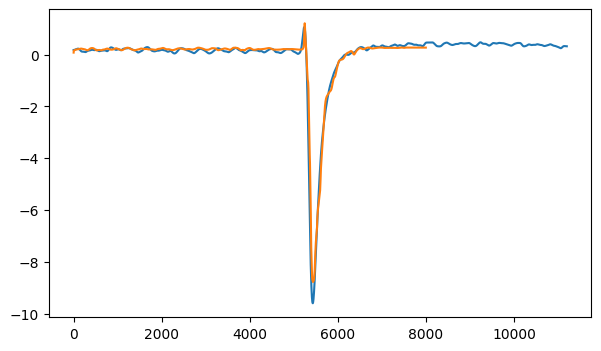

win1000batch16n_hidden200dropout2num_layers2interval


  0%|          | 0/100 [00:00<?, ?it/s]

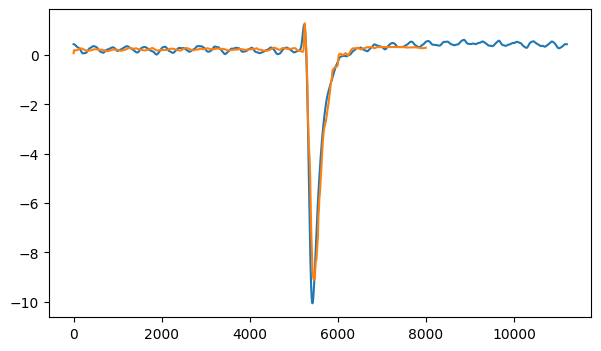

TypeError: unhashable type: 'dict_keys'

In [43]:
metrics={}
win_batch = [(1000, 16)]
n_hiddens = [200]
dropouts = [0.2]
mode = "interval"
num_layers=2
preds=[]
for win, batch in win_batch:
    for n_hidden in n_hiddens:
        for dropout in dropouts:
                b_metric=[]
                exp_name = "win" + str(win) + "batch" + str(batch) + "n_hidden" + str(n_hidden) + \
                            "dropout" + str(int(dropout*10)) + "num_layers" + str(num_layers) + mode
                for i in range(len(averaged1)):
                    test_ca1= []
                    test_ca3= []
                    test_ca1.append(averaged1[i])
                    test_ca3.append(averaged3[i])
                    
                    temp1 = averaged1
                    temp3 = averaged3
                    train_ca1 =np.delete(temp1, i, 0)
                    train_ca3 = np.delete(temp3, i, 0)
                    hop_len = win // 2
                    best_loss, best_metric, pred, model_lstm = RunExperement(i, j, train_ca3, train_ca1, test_ca3, test_ca1, batch, win, hop_len, n_hidden, dropout, num_layers, mode, exp_name,epochs=100)
                    b_metric.append(best_metric)
                    preds.append(pred)
                metrics[np.mean(b_metric)]=exp_name
best_params=metrics[np.min(metrics.keys())]

In [62]:
torch.save(model_lstm.state_dict(), "lstm_model.pth")

In [61]:
%%capture cap
for k, v in model_lstm.named_parameters():
    print(k, v)
with open('lstm_weights.txt', 'w') as f:
    f.write(cap.stdout)

In [55]:
model_lstm

LSTMModel(
  (linear_1): Linear(in_features=1, out_features=200, bias=True)
  (relu): ReLU()
  (lstm): LSTM(200, 200, num_layers=2, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (linear_2): Linear(in_features=400, out_features=1, bias=True)
)

In [82]:
best_params=metrics[np.min(list((metrics.keys())))]

In [83]:
best_params

'win1000batch16n_hidden50dropout3num_layers2interval'

# Обучение на лучших подобранных параметрах

In [32]:
#составить preds для быстрого вывода
win=1000
batch=16
n_hidden=50
dropout=0.3
num_layers=2
preds=[]
trues=[]
idxs=[]

model= LSTMModel(input_size=1, hidden_layer_size=n_hidden, num_layers=2, output_size=1, dropout=dropout)
model = model.to('cuda')
model.load_state_dict(torch.load(f'Best_i_{i}_j_{j}_exp'))
trues.append(averaged1[i])

test_inout_seq = create_inout_sequences(averaged3[i], averaged1[i], win, win // 2, batch_size=batch)

test_dataloader = DataLoader(test_inout_seq, batch_size=batch, shuffle=False, drop_last=True)
preds.append(GetPredSignal(model, win, win // 2, test_dataloader))


test_inout_seq = create_inout_sequences(averaged3[j], averaged1[j], win, win // 2, batch_size=batch)
test_dataloader = DataLoader(test_inout_seq, batch_size=batch, shuffle=False, drop_last=True)
preds.append(GetPredSignal(model, win, win // 2, test_dataloader))
trues.append(averaged1[j])

FileNotFoundError: [Errno 2] No such file or directory: 'Best_i_0_j_1_exp'

In [86]:
def printMetrics(signal, maxlen=MAXLEN):
    left = right = argmin = semiLeft = semiRight = np.argmin(signal)
    minValue = signal[argmin]
    semiMin = minValue/2
    mean = np.mean(signal)
    found = False
    while signal[left]<mean and left>0:
        left-=1
        if (signal[left]>semiMin) and not found:
            semiLeft = left
            found = True
    found = False
    while signal[right]<mean and right<maxlen:
        right+=1
        if (signal[right]>semiMin) and not found:
            semiRight = right
            found = True
    SL = (argmin-semiLeft)/abs(minValue)
    HW = semiRight-semiLeft
    TD = argmin - left
    TR = right - argmin
    return [SL, left, right, semiLeft, semiRight]

In [87]:
#вывод в msec

fig, ax = plt.subplots(30, figsize=(20, 150), dpi=400)
fig.subplots_adjust(left=0.2)
for i in range(0, len(preds), 2):
    true1 = trues[i]
    true2 = trues[i+1]
    pred1 = preds[i]
    pred2 = preds[i+1]
    x1=np.linspace(0, len(true1)/20, len(trues[i]))
    y1=np.linspace(0, len(preds[i])/20, len(preds[i]))
    x2=np.linspace(0, len(trues[i])/20, len(trues[i]))
    y2=np.linspace(0, len(preds[i])/20, len(preds[i]))
    
    trueM1 = printMetrics(true1)
    predM1 = printMetrics(pred1)
    trueM2 = printMetrics(true2)
    predM2 = printMetrics(pred2)

    
    left = 0
    right = MAXLEN/20
    #ax[i].figure(dpi = 300, figsize=(16, 9))
    ax[i].set_ylim(np.min(np.hstack([true1, pred1])), np.max(np.hstack([true1, pred1])))
    ax[i].set_xlim([left, right])
    ax[i].plot(x1, true1, label="true")
    ax[i].plot(y1, pred1, label="pred")

    ax[i+1].plot(x2, true2, label="true")
    ax[i+1].plot(y2, pred2, label="pred")
    
    
    coeff1_1 = getMetrics(pred1)
    coeff2_1 = getMetrics(true1)
    
    coeff1_2 = getMetrics(pred2)
    coeff2_2 = getMetrics(true2)
    
    ax[i].set_title(f'Test {int(i / 2)}, amp {idxs[i]}. metric = 0.2*({coeff1_1[0]:.2f} - {coeff2_1[0]:.2f})**2 + 0.4*({coeff1_1[1]:.2f} - {coeff2_1[1]:.2f})**2 + 0.1*({coeff1_1[2]:.2f} - {coeff2_1[2]:.2f})**2 + 0.3*({coeff1_1[3]:.2f} - {coeff2_1[3]:.2f})**2 =  {0.2*(coeff1_1[0] - coeff2_1[0])**2 + 0.4*(coeff1_1[1] - coeff2_1[1])**2 + 0.1*(coeff1_1[2] - coeff2_1[2])**2 + 0.3*(coeff1_1[3] - coeff2_1[3])**2}')
    ax[i+1].set_title(f'Test {int(i / 2)}, amp {idxs[i+1]}. metric = 0.2*({coeff1_2[0]:.2f} - {coeff2_2[0]:.2f})**2 + 0.4*({coeff1_2[1]:.2f} - {coeff2_2[1]:.2f})**2 + 0.1*({coeff1_2[2]:.2f} - {coeff2_2[2]:.2f})**2 + 0.3*({coeff1_2[3]:.2f} - {coeff2_2[3]:.2f})**2 =  {0.2*(coeff1_2[0] - coeff2_2[0])**2 + 0.4*(coeff1_2[1] - coeff2_2[1])**2 + 0.1*(coeff1_2[2] - coeff2_2[2])**2 + 0.3*(coeff1_2[3] - coeff2_2[3])**2}')
    #ax[i].set_title(f'Test {i}. Metric={best_metric:.6f}=0.5*({coeff1[0]:.2f}-{coeff2[0]:.2f})^2 +0.5*({coeff1[1]:.2f}-{coeff2[1]:.2f})^2')
    ax[i].plot(np.linspace(trueM1[-2]/20, trueM1[-1]/20, (trueM1[-1]-trueM1[-2])), [true1[trueM1[-2]] for i in range(trueM1[-2], trueM1[-1])], label="true HW", color = 'green')
    ax[i+1].plot(np.linspace(trueM2[-2]/20, trueM2[-1]/20, (trueM2[-1]-trueM2[-2])), [true2[trueM2[-2]] for i in range(trueM2[-2], trueM2[-1])], label="true HW", color = 'green')
    ax[i].axvline(trueM1[1]/20, label="true TD", color = 'red')
    ax[i+1].axvline(trueM2[1]/20, label="true TD", color = 'red')
    ax[i].axvline(trueM1[2]/20, label="true TR", color = 'purple')
    ax[i+1].axvline(trueM2[2]/20, label="true TR", color = 'purple')
    #вывод slope
    ax[i].plot(np.linspace(predM1[-2]/20, predM1[-1]/20, (predM1[-1]-predM1[-2])), [pred1[predM1[-2]] for i in range(predM1[-2], predM1[-1])], label="pred HW", color = 'green')
    ax[i+1].plot(np.linspace(predM2[-2]/20, predM2[-1]/20, (predM2[-1]-predM2[-2])), [pred2[predM2[-2]] for i in range(predM2[-2], predM2[-1])], label="pred HW", color = 'green')
    ax[i].axvline(predM1[1]/20, label="pred TD", color = 'red')
    ax[i+1].axvline(predM2[1]/20, label="pred TD", color = 'red')
    ax[i].axvline(predM1[2]/20, label="pred TR", color = 'blue')
    ax[i+1].axvline(predM2[2]/20, label="pred TR", color = 'blue')
    ax[i].set_ylabel("V, normalized")
    ax[i+1].set_ylabel("V, normalized")
    #fig.align_ylabels(axs[:, 1])
    ax[i].set_xlabel("t, seconds")
    ax[i+1].set_xlabel("t, seconds")
    ax[i].legend()
    ax[i+1].legend()

In [ ]:
0 1 2 3 4 5